# <center>Analysis of Covid-19 chest X-rays</center>
In order to diagnose patients with Covid-19, the analysis of chest X-rays is a possibility to be explored to more easily detect positive cases. If the classification through deep learning of such data proves effective in detecting positive cases, then this method can be used in hospitals and clinics when traditional testing cannot be done.


In [1]:
import matplotlib
matplotlib.__version__

'3.6.2'

In [ ]:
!pip install matplotlib --upgrade

Initialise code for google colab

Mount google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


Create data base files under google colab environment

In [ ]:
!unzip '/content/drive/MyDrive/data.zip' -d '/content/'

Define working directory to our jupyter repertory:
* because path to the different repertories (./data, ./output...) are define relatevly to jupyter one
* let import _mypath which add ./lib to python path in order to import our own define libraries


In [ ]:
# for google colab use
%cd /content/gdrive/MyDrive/covid-19-xRay/jupyter
db_work_dir = '/content'

In [2]:
# for local use
db_work_dir = '..'

In [3]:
import _mypath
import os
import shutil
import pandas as pd
import numpy as np
import cv2 # import OpenCV
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
import seaborn as sns
import joblib

from sklearn.metrics import silhouette_score

%load_ext autoreload
%autoreload 1

Build paths and variables for reading data base hierarchy

In [4]:
%aimport database.path_origin_data

from database.path_origin_data import build_data_paths 
from database.path_origin_data import lung_name, infection_name
from database.path_origin_data import train_name, test_name, valid_name
from database.path_origin_data import normal_name, covid_name, no_covid_name
from database.path_origin_data import images_name, lung_mask_name, infection_mask_name
from database.path_origin_data import lung_dirname, infection_dirname

from database.path_origin_data import images_dirname, lung_masks_dirname, infection_masks_dirname

In [5]:
db_name_origin = 'data'
db_name_equalize = 'data_equalize'

db_path_origin = os.path.join(db_work_dir, db_name_origin)
db_path_equalize = os.path.join(db_work_dir, db_name_equalize)

output_path = os.path.join('..', 'output', 'data_exploration')
if not os.path.exists(output_path):
    os.makedirs(output_path, exist_ok=True)

In [6]:
help(build_data_paths)

data_paths = build_data_paths()
idx = pd.IndexSlice

Help on function build_data_paths in module database.path_origin_data:

build_data_paths()
    output: data_path dataFrame
        * with index= ['db_name', 'ds_name', 'desease_name', 'data_type_name']
          for database name, dataset name, desease or label name and data type name
        * path: folders hierarchical string path
    
    access to the desire paths with:
    idx = pd.IndexSlice
    work_index = idx[db_name_idx, ds_name_idx, desease_name_idx, data_type_name_idx]
    work_paths = data_paths['path'].loc[work_index]
    
        * db_name_idx values: lung_name and infection_name
        * ds_name_idx values: train_name, valid_name,and test_name
        * desease_name_iidx values: normal_name, covid_name and no_covid_name
        * data_type_name_idx values: images_name, lung_mask_name and infection_mask_name
    
    example:
    work_index = idx[[lung_name, infection_name],:,:,[images_name]]
    and
    work_index = idx[:,:,:,[images_name]]
    Give the indexes to acce

Test equalizer function

**You can use code at the end of this notebook to produce severals plots at one time to compare images before and after intensity transformation**

Lung Segmentation Data/Val/COVID-19/images
../data/Lung Segmentation Data/Val/COVID-19/images/sub-S09683_ses-E25533_run-1_bp-chest_vp-ap_cr.png


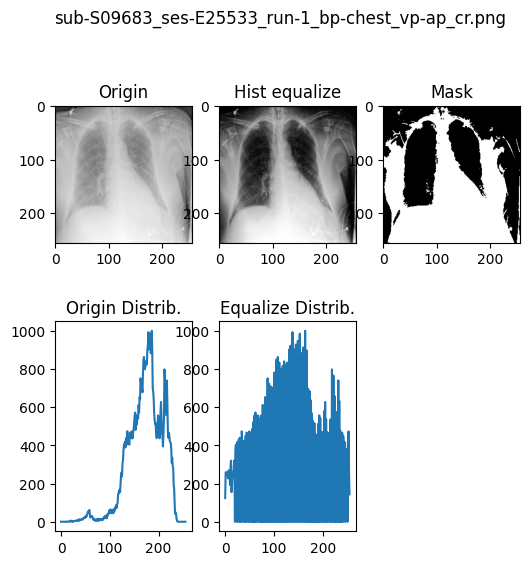

In [7]:
path = data_paths['path'].loc[idx[[lung_name], valid_name, covid_name, images_name]][0]
print(path)
full_file_path = os.path.join(db_path_origin, path)
file_names = os.listdir(full_file_path)

# n = np.random.randint(0, len(file_names))
# print(n)
# file_name = file_names[n]
file_name = 'covid_1256.png'
file_name = 'sub-S09683_ses-E25533_run-1_bp-chest_vp-ap_cr.png'

full_file_name = os.path.join(full_file_path, file_name)
print(full_file_name)

image = cv2.imread(full_file_name, 0) 
image_rect = cv2.equalizeHist(image)

hist = cv2.calcHist([image],[0],None,[256],[0,256])
hist_rect = cv2.calcHist([image_rect],[0],None,[256],[0,256])

q1, q2 = scipy.stats.mstats.mquantiles(image_rect.flatten(), prob=[0.05, 0.95])

alpha = 0.7
threshold = (1. - alpha) * q1 + alpha * q2
ret, thresh = cv2.threshold(image, threshold, 255, 0)

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(6, 6))
fig.suptitle(os.path.basename(full_file_name))
ax.flatten()[0].imshow(image, cmap='gray');
ax.flatten()[0].set_title('Origin')
ax.flatten()[1].imshow(image_rect, cmap='gray');
ax.flatten()[1].set_title('Hist equalize')
ax.flatten()[2].imshow(thresh, cmap='gray');
ax.flatten()[2].set_title('Mask')
ax.flatten()[3].plot(hist);
ax.flatten()[3].set_title('Origin Distrib.')
ax.flatten()[4].plot(hist_rect);
ax.flatten()[4].set_title('Equalize Distrib.')
ax.flatten()[5].axis('off')

fig.savefig(os.path.join(output_path, 'pixels_distribution_' + file_name))


Compute statistics and geometrical metrics to analyse images.

Store the results, one file by image, in a folder hierarchy locatated under outpu_path and identical to database structure.

Deinition of stats filenames.

In [7]:
crude_stats_filename = 'crude_stats.joblib'
equalize_stats_filename = 'equalize_stats.joblib'

Choose the statistics filename

In [8]:
# stats_filename = crude_stats_filename
stats_filename = equalize_stats_filename

Process the images of all the database.

In [10]:
for path in data_paths.loc[idx[:,:,:,images_name]]['path']:
    full_file_path = os.path.join(db_path_origin, path)
    full_output_path = os.path.join(output_path, path)
    #print(full_output_path)
    if not os.path.exists(full_output_path):
        os.makedirs(full_output_path, exist_ok=True)
    
    #print(full_file_path)
    file_names = os.listdir(full_file_path)
    
    stats_list = []
    for i, file_name in enumerate(file_names[:]):
        full_file_name = os.path.join(full_file_path, file_name)

        # read image
        # print(full_file_name)
        image = cv2.imread(full_file_name, 0)   

        # equalize image pixels
        # TO DESACTIVATE for crude statistique study
        # hist = cv2.calcHist([image], [0], None, [256],[0,256])
        image = cv2.equalizeHist(image)
        
        # first moments of image pixels distribution
        flatten_image = np.asarray(image).flatten()
        _, (mini, maxi), mean, var, skew, kurt = scipy.stats.describe(flatten_image)
        std = np.sqrt(var)
        # quantils
        q05, q1, median, q3, q95 = scipy.stats.mstats.mquantiles(flatten_image, prob=[0.05, 0.25, 0.5, 0.75, 0.95])
        
        # image mask by thresholding
        alpha = 0.7
        threshold = (1. - alpha) * q1 + alpha * q2
        ret, thresh = cv2.threshold(image, threshold, 1, 0)

        # iniertial moment of the mask: geometrical information
        m = cv2.moments(thresh)
        
        x_center = m["m10"] / m["m00"] if m["m00"] != 0 else m["m10"]
        y_center = m["m01"] / m["m00"] if m["m00"] != 0 else m["m01"]
        #print(m)
        #cv2.circle(image, (int(x_center), int(y_center)), 5, (255), -1)
        #cv2.imshow("Image", image)
        #cv2.waitKey(0)
        #cv2.destroyAllWindows()
        
        # store results
        stats_list.append([full_file_name,
                           mini, q1, median, q3, maxi, mean, std, skew, kurt,
                           m["m00"],
                           x_center, y_center,
                           m["nu20"], m["nu11"], m["nu02"],
                           m["nu30"], m["nu21"], m["nu12"], m["nu03"]])
    
    # store results in pandas dataframe
    stats = pd.DataFrame(stats_list, columns=['file_name',
                                              'mini', 'q1', 'median', 'q3', 'maxi', 'mean', 'std', 'skew', 'kurt',
                                              'm00',
                                              'x_center', 'y_center',
                                              'nu20', 'nu11', 'nu02',
                                              'nu30', 'nu21', 'nu12', 'nu03'])
    # save results in stats_filename
    full_stats_name = os.path.join(full_output_path, stats_filename)
    joblib.dump(stats, full_stats_name)



Define the working data base:
* lung_name for Lung Segmentation Data
* infection_name for Infection Segmentation Data

Use `help(build_data_paths)` for more information

In [9]:
# work_index = idx[[infection_name],:,:,[images_name]]
work_index = idx[[lung_name],:,:,[images_name]]
# work_index = idx[:,:,:,[images_name]]

Read the statistical and geometrical metrics files on work_index directories.

Put the results in:
* a pandas dataframe with the statitics: stats
* a pandas dataFrame true_labels with following columns:
  * db_name: the data base name (Lung or Infection one),
  * ds_name:  dataset name (train, valid, test)
  * desease_name: normal, covid, no_covid
  * data_type_name: images, lung masks, infection masks
* a pandas dataFrame file_names with the path to the associated image

<div class="alert alert-block alert-info">
<b>Note:</b> In the folowing code, I make file_names pointed to the database with equalize hist images.
</div>
  

In [10]:
# stats filename to work on
# stats_used = crude_stats_filename
stats_used = equalize_stats_filename

# initialize dataframe
stats = None
true_labels = None

work_data_path = data_paths.loc[work_index]
print(len(work_data_path))
# work_data_path_index = work_data_path.index
# print(work_data_path_index[0])

for (ind, path) in work_data_path['path'].items():
    full_output_path = os.path.join(output_path, path)
    full_stats_name = os.path.join(full_output_path, stats_used)
    #print(os.path.exists(full_stats_name))
    
    # print(ind)
    stats_tmp = joblib.load(full_stats_name)
    # print(ind[2])
    true_labels_tmp = pd.DataFrame(data=[ind], columns=['db_name', 'ds_name', 'desease_name', 'data_type_name'])
    n = stats_tmp.shape[0]
    true_labels_tmp = true_labels_tmp.loc[true_labels_tmp.index.repeat(n)]
    
    if stats is None:
        stats = stats_tmp
        true_labels = true_labels_tmp
    else:
        stats = pd.concat([stats, stats_tmp], axis=0)
        true_labels = pd.concat([true_labels, true_labels_tmp], axis=0)
        
print(stats.shape)
#stats.index = work_index
file_names = stats['file_name'].reset_index(drop=True)

# to comment if you want to plot original images
file_names = file_names.apply(lambda file_name: file_name.replace(db_name_origin, db_name_equalize))

stats = stats.drop(columns=['file_name']).reset_index(drop=True)
true_labels = true_labels.reset_index(drop=True)
print(file_names.shape)
print(true_labels.shape)
#file_names
print(file_names.head())
print(true_labels.head())

9
(33918, 20)
(33918,)
(33918, 4)
0    ../data_equalize/Lung Segmentation Data/Train/...
1    ../data_equalize/Lung Segmentation Data/Train/...
2    ../data_equalize/Lung Segmentation Data/Train/...
3    ../data_equalize/Lung Segmentation Data/Train/...
4    ../data_equalize/Lung Segmentation Data/Train/...
Name: file_name, dtype: object
  db_name ds_name desease_name data_type_name
0    lung   train     no_covid         images
1    lung   train     no_covid         images
2    lung   train     no_covid         images
3    lung   train     no_covid         images
4    lung   train     no_covid         images


Duplicates detection base on equal statistics metrics.

In [11]:
print(stats.duplicated().sum())
print(len(true_labels[true_labels['db_name'] == infection_name]))
print(len(stats))

stats_file = pd.concat([stats, file_names], axis=1)
cols = stats_file.columns[:-1]
test = stats_file.sort_values(cols.to_list())
test_gp = test.groupby(by=cols.to_list())

pd.set_option('display.max_colwidth', None)
i = 0
for key, values in test_gp.groups.items():
  if len(values) == 1:
    continue
  print(test.loc[values]['file_name'], "\n")
  i += 1
  if i >= 10:
    break;
pd.reset_option('display.max_colwidth')
# test_gp.head()



0
0
33918


* In fact Infection database is an extract from Lung database with additional desease mask information.<br>
**If you want to see this, run the notebook on the original databases and with work_index on Lung and Infection databases.**

* Duplicated images discarded from database:<br>
keep ../data/Lung Segmentation Data/Test/COVID-19/images/covid_978.png <br>
discarded / already discarded ../data/Lung Segmentation Data/Val/COVID-19/images/covid_2473.png <br>
<br>
keep ../data/Lung Segmentation Data/Train/COVID-19/images/covid_686.png <br>
discarded / already discarded ../data/Lung Segmentation Data/Test/COVID-19/images/covid_3155.png <br>
<br>
keep ../data/Infection Segmentation Data/Train/COVID-19/images/covid_686.png <br>
discarded / already discarded ../data/Infection Segmentation Data/Test/COVID-19/images/covid_3155.png <br>
**If you want to see this duplicates, run the notebook on the original database and with work_index on Lung database only.**


Features correlation map

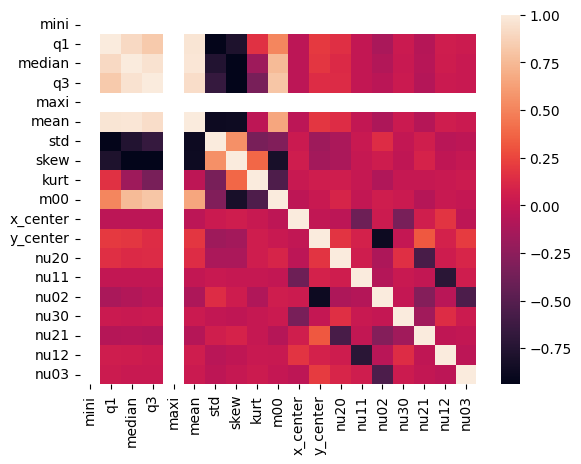

In [12]:
sns_plot = sns.heatmap(data=stats.corr());

fig = sns_plot.get_figure()
plt.savefig(os.path.join(output_path, 'all features correlation.png'), format='png')

Features selection

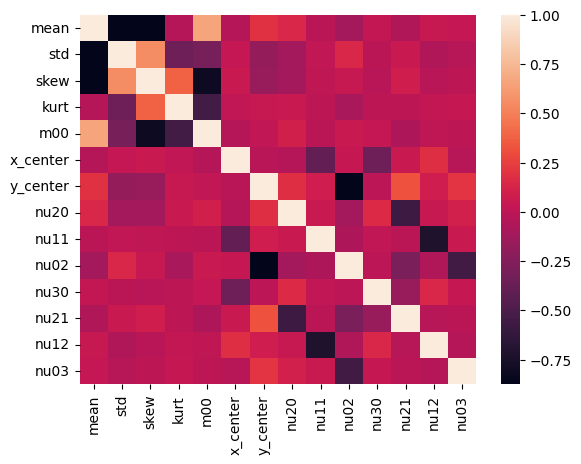

In [13]:
stats = stats.drop(columns=['mini', 'maxi', 'median', 'q1', 'q3'])
sns_plot = sns.heatmap(data=stats.corr());

fig = sns_plot.get_figure()
plt.savefig(os.path.join(output_path, 'selected features correlation.png'), format='png')

Features distribution visualization

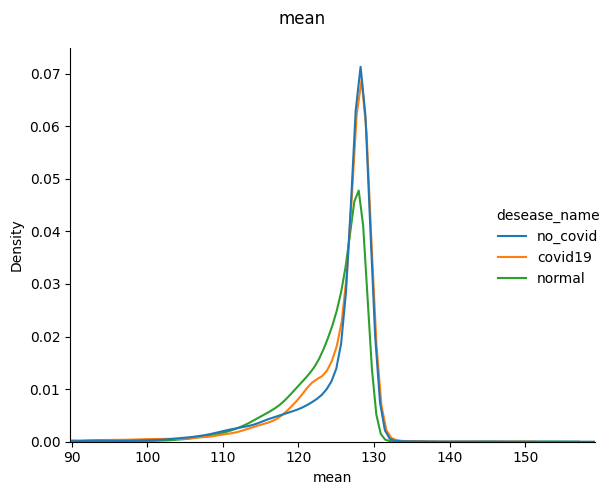

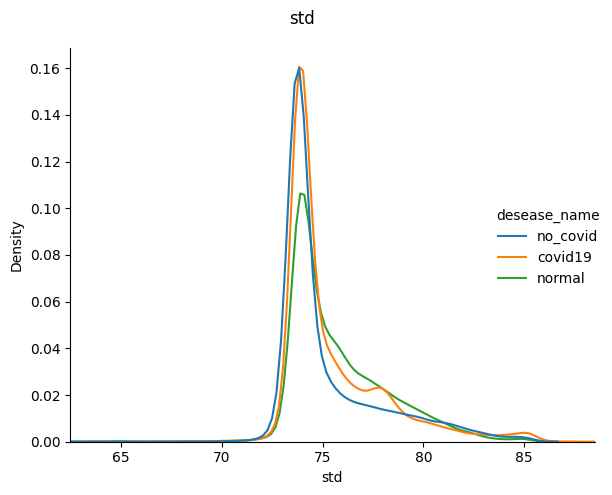

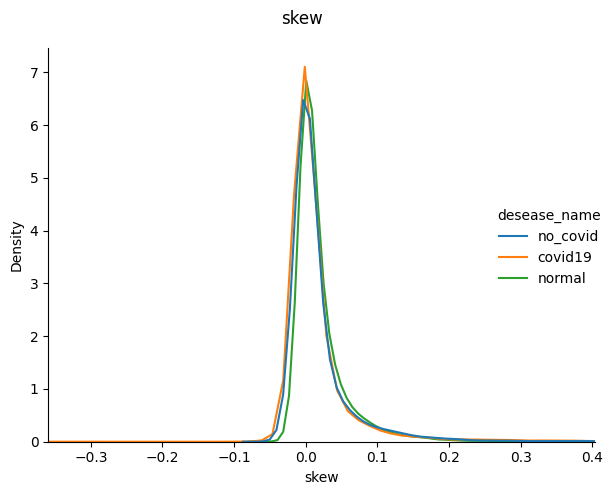

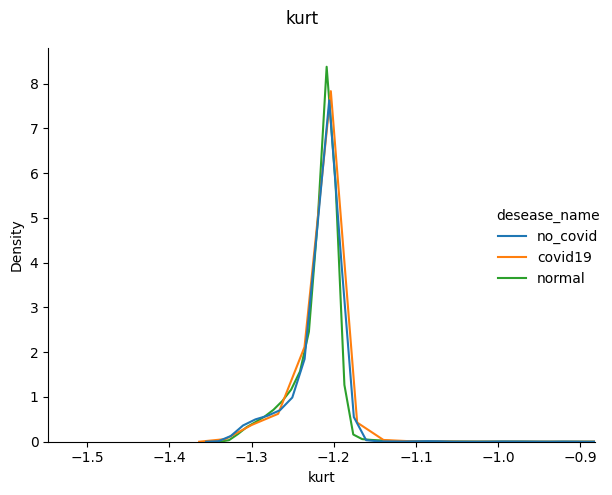

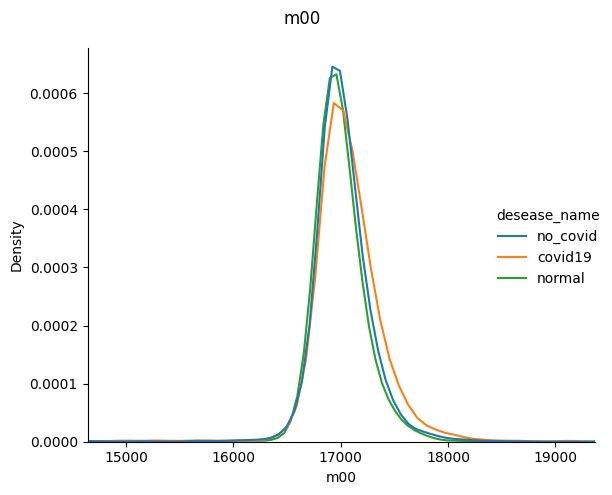

...

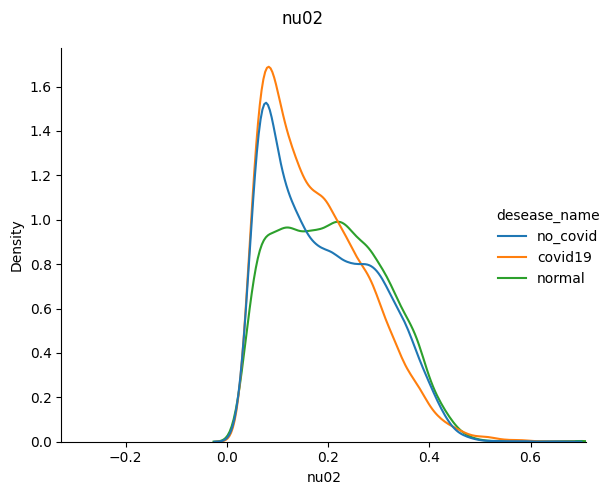

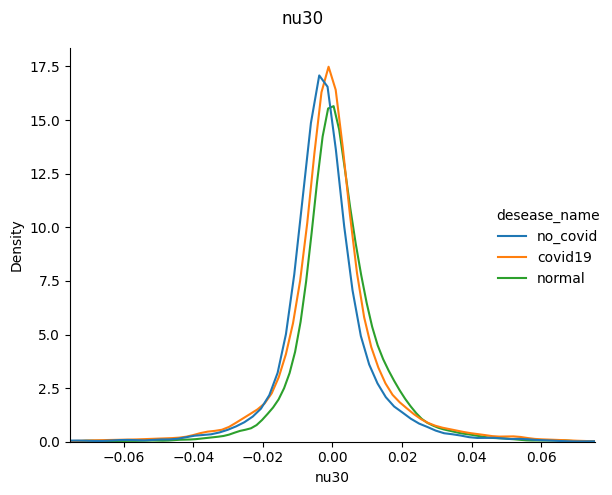

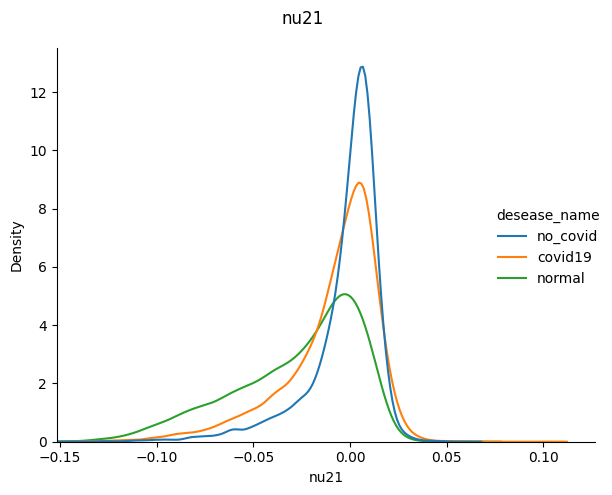

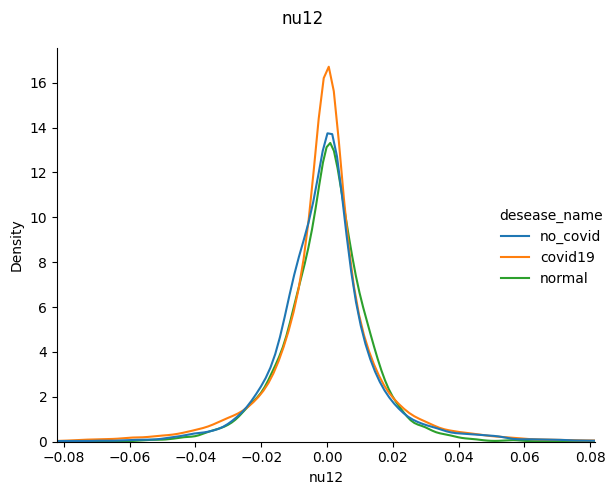

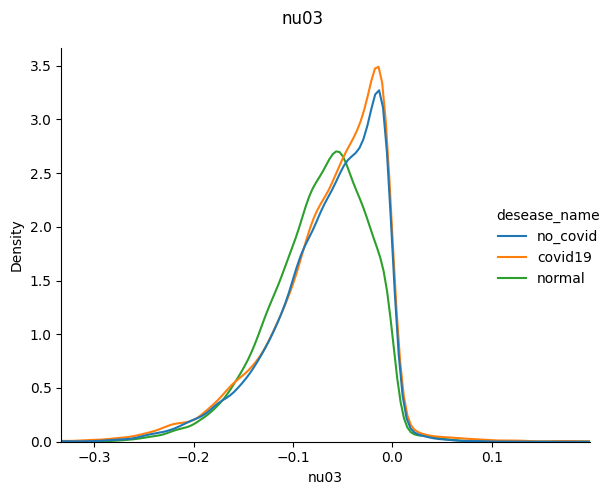

In [15]:
stats_visu = pd.concat([stats, true_labels['desease_name']], axis=1)
# stats_visu.info()

output_visu_path = os.path.join(output_path, 'features')
if not os.path.exists(output_visu_path):
    os.makedirs(output_visu_path, exist_ok=True)

range_rate = 5
cols = stats_visu.select_dtypes(include=['number']).columns
for i, col in enumerate(cols):
  m = stats[col].mean()
  std = stats[col].std()
  sns_plot = sns.displot(data=stats_visu, x=col, hue='desease_name', kind='kde')
  # sns_plot = sns.displot(data=stats_visu, x=col, hue='desease_name', kind='hist', stat='density', common_norm=False)
  
  sns_plot.fig.suptitle(col)
  sns_plot.fig.tight_layout()
  plt.xlim([m-range_rate*std, m+range_rate*std])
  plt.savefig(os.path.join(output_visu_path, col + '.png'), format='png')
  plt.show()


Features scaling

In [16]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_stats = scaler.fit_transform(stats)
scaled_stats = pd.DataFrame(scaled_stats, columns=stats.columns)


PCA analysis

In [36]:
from sklearn.decomposition import PCA

pca = PCA(tol=1e-6, random_state=456)
principalComponents = pca.fit_transform(scaled_stats)
principalComponents.shape

(33918, 14)

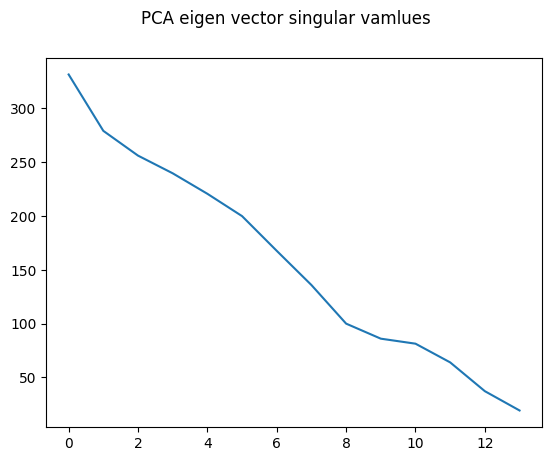

In [37]:

eigan_val = pca.singular_values_
x = range(0, eigan_val.shape[0])
plt.plot(x, eigan_val);
plt.suptitle('PCA eigen vector singular vamlues')
plt.savefig(os.path.join(output_path, 'pca singular values.png'), format='png')

Features selection:

I keep those over 10% (threshold: 30) of the first one (ie the main one) -> 11 dimensions kept.

In [38]:
num_dim = 11
selected_features = principalComponents[:, :num_dim]
# selected_features = principalComponents
# selected_features = scaled_stats
selected_features.shape

(33918, 11)

Outliers detection

In [ ]:
# from sklearn import svm

# clf_osvm = svm.OneClassSVM(kernel='rbf', nu=0.00001, gamma='scale')
# # Model training
# clf_osvm.fit(selected_features)
# # Prediction from the explanatory variables of the test sample
# y_pred_osvm = clf_osvm.predict(selected_features)
# print(y_pred_osvm.shape)


In [39]:
from sklearn.ensemble import IsolationForest

isof = IsolationForest(contamination=0.0025, n_estimators=250, n_jobs=-1)

isof.fit(selected_features)
y_pred_isof = isof.predict(selected_features)
print(y_pred_isof.shape)


(33918,)


In [40]:
# y_pred_select = y_pred_osvm
y_pred_select = y_pred_isof
print(y_pred_select.shape)


(33918,)


Outliers visualization

85


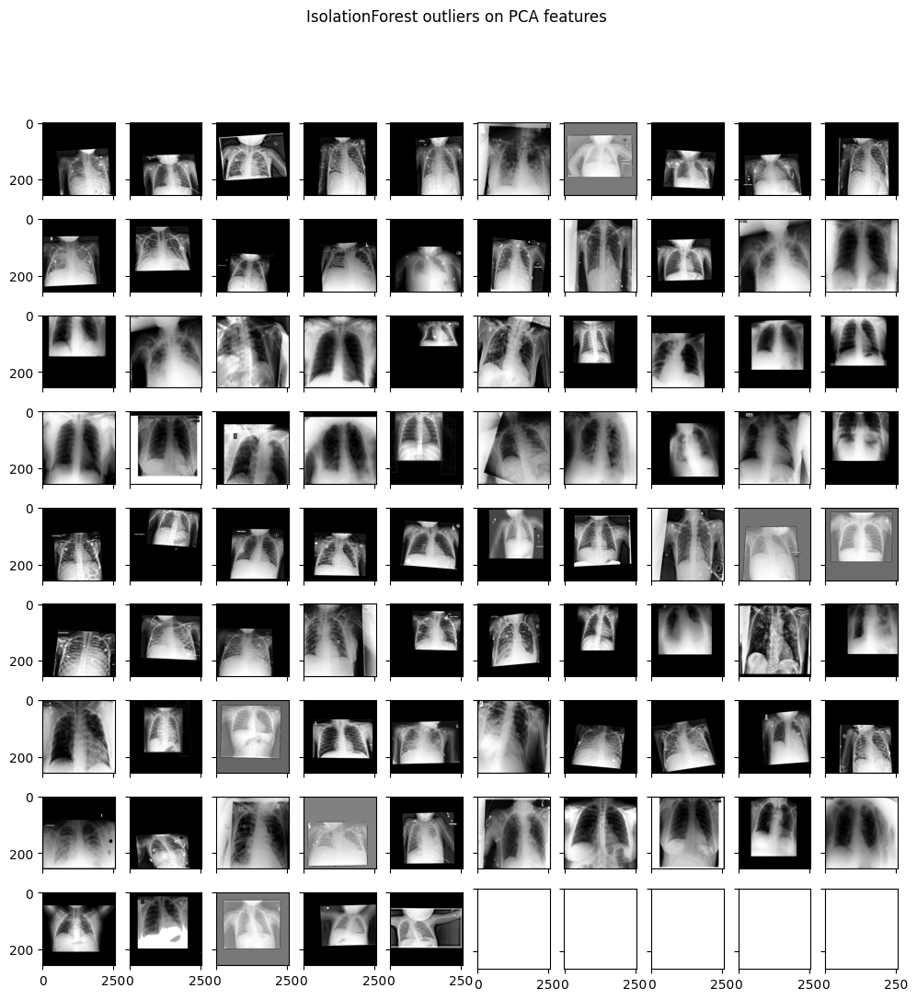

['../output/data_exploration/outliers.joblib']

In [41]:
ind = y_pred_select == -1
n_outliers = y_pred_select[ind].shape[0]
print(n_outliers)

# outliers = true_labels[ind]
# # outliers
# outliers['place'] = outliers.apply(lambda x: x['db_name'] + ' ' + x['ds_name'] + ' ' + x['desease_name'], axis=1)
# print(outliers['place'].unique())

outliers = file_names[ind]
n = len(outliers)
nrows = 9
ncols = 10
num_img = nrows * ncols
samples = outliers
if num_img < len(samples):
    samples = samples.sample(n=num_img, replace=False)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True, figsize=(12, 12))
fig.suptitle('IsolationForest outliers on PCA features')
for i, file_name in enumerate(samples):
    image = cv2.imread(file_name, 0)
    image = cv2.equalizeHist(image)    
    ax.flatten()[i].imshow(image, cmap='gray')

plt.savefig(os.path.join(output_path, 'outliers.png'), format='png')
plt.show()
joblib.dump(outliers, os.path.join(output_path, 'outliers.joblib'))

Discard outliers for the following analysis.

But I don't descarded them from our database because:
* their number is small in regards to the whole database sample
* somme are atypical but not all of them
* atypcal ones are still chest X-ray and worth to be trained in order to have a chance to detect covid on them.

**We also can see that equalization didn't work on some images. The ones with still gray background.** <br>
**Is due to the presence of a black borderline around the real x-ray.** <br>
**It would have been better to descard them from the database or detect and correct these images, but I didn't have time to do it.**

In [42]:
# print(len(y_pred_select))
# print(len(file_names))
# print(len(true_labels))
# print(len(selected_features))

selected_features_cleaned = selected_features[y_pred_select == 1, :]

drop = y_pred_select == -1
file_names_cleaned = file_names.drop(file_names.iloc[drop].index).reset_index(drop=True)
true_labels_cleaned = true_labels.drop(true_labels.iloc[drop].index).reset_index(drop=True)



In [43]:
# print(len(file_names_cleaned))
# print(len(true_labels_cleaned))
# print(len(selected_features_cleaned))
print(file_names_cleaned.head())
print(true_labels_cleaned.head())


0    ../data_equalize/Lung Segmentation Data/Train/...
1    ../data_equalize/Lung Segmentation Data/Train/...
2    ../data_equalize/Lung Segmentation Data/Train/...
3    ../data_equalize/Lung Segmentation Data/Train/...
4    ../data_equalize/Lung Segmentation Data/Train/...
Name: file_name, dtype: object
  db_name ds_name desease_name data_type_name
0    lung   train     no_covid         images
1    lung   train     no_covid         images
2    lung   train     no_covid         images
3    lung   train     no_covid         images
4    lung   train     no_covid         images


K-means clustering.

The idea here is to:
* try to detect different classes in the database.
* analyse and visualize them to see if we can detect interesting feature
* evaluate if a classical ml approach on statistical features have a chance to succeed

<div class="alert alert-block alert-info">
<b>Note:</b>
In the following code silhouette computation is long. You can comment the associated part to gain some time. <br>
In fact bug in silhouette. Don't have time to debug.
</div>

In [44]:
from sklearn.cluster import KMeans

kmeans_kwargs = {'n_init':10}
sse = []
s_scores = []
k_number = 40
for k in range(1, k_number):
   kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
   kmeans.fit(selected_features_cleaned)
   sse.append(kmeans.inertia_)

# forscores.appe k in range(2, k_number):
#    # Calculation of the silhouette coefficient
#    s_score = silhouette_score(selected_features_cleaned, kmeans.labels_, metric='sqeuclidean')
#    s_nd(s_score)


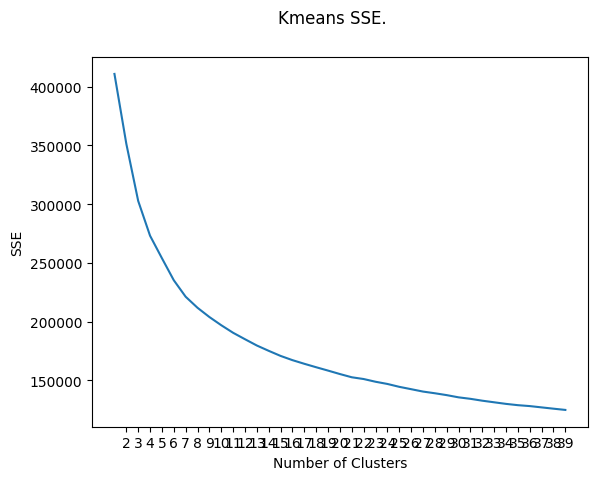

In [45]:
fig, ax1 = plt.subplots()
fig.suptitle('Kmeans SSE.')
# fig.suptitle('Kmeans SSE and Silhouette.')
ax1.set_xticks(range(2, k_number))
ax1.set_xlabel("Number of Clusters")
ax1.set_ylabel("SSE")
ax1.plot(range(1, k_number), sse)

# ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
# ax2.set_ylabel("Silhouette")
# ax2.plot(range(2, k_number), s_scores)

plt.savefig(os.path.join(output_path, 'sse vs n clusters.png'), format='png')
# plt.savefig(os.path.join(output_path, 'sse and silhouette vs n clusters.png'), format='png')
plt.show()
plt.close(fig)


We want to have an overview of the data and not to go too far in details so I keep homogenous classes with population from max to half the max observed.
-> I keep 10 classes

In [46]:
n_clusters = 10
kmeans_kwargs = {}
kmeans = KMeans(n_clusters=n_clusters, random_state=123, **kmeans_kwargs)
kmeans.fit(selected_features_cleaned)

print(kmeans.labels_.shape)

/Users/luc/.local/share/virtualenvs/covid-19-xRay-gI8RPtYc/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


(33833,)


Cluster visualization

In [47]:
visu = pd.concat([pd.DataFrame(selected_features_cleaned), pd.DataFrame(kmeans.labels_, columns=['label']), true_labels], axis=1)

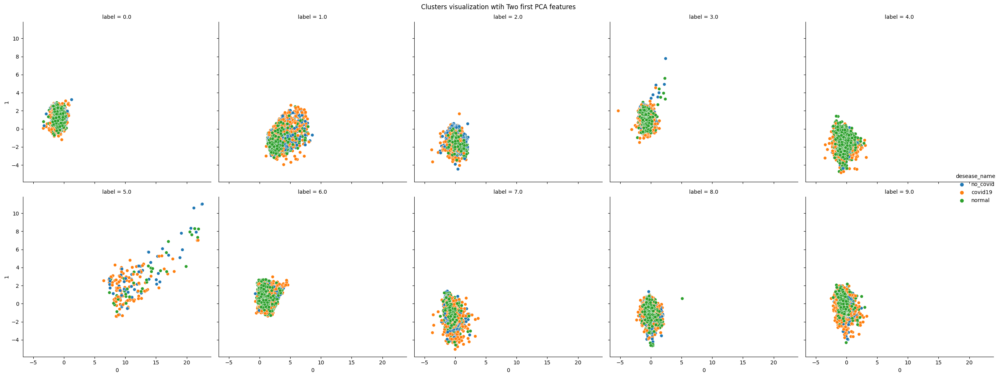

In [48]:
sns_plot = sns.relplot(data=visu, x=0, y=1, hue='desease_name', col='label', col_wrap=5);

fig = sns_plot.fig
fig.suptitle('Clusters visualization wtih Two first PCA features')
fig.tight_layout()
plt.savefig(os.path.join(output_path, 'clusters.png'), format='png')

Analyse distribution of classes through deseases and dataset

<div class="alert alert-block alert-info">
<b>Note:</b> It seams that I have an issue with my seaborn lib. If one of you can comment the multiple lines in displot to see if you have the expected graph with overlapping histogramme in place of stacking them for me.
</div>

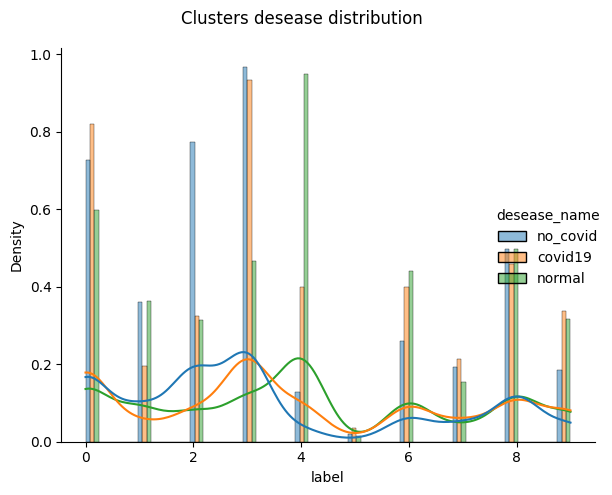

In [49]:
sns_plot = sns.displot(
  data=visu, x='label', hue='desease_name',
  kind='hist', stat='density', common_norm=False, kde=True,
  fill=True,
  multiple='dodge',
)

sns_plot.fig.suptitle('Clusters desease distribution')
sns_plot.fig.tight_layout()
plt.savefig(os.path.join(output_path, 'Clusters desease distribution.png'), format='png')

No classes are really discriminat for isolating one of our target label (normal, covid, no_covid).

This is a hint that such a classical approach won't succed to classify the data correctly.

**It could be interesting to produce a statistical analysis (ANOVA) of this simple clustering to "prove" it.**


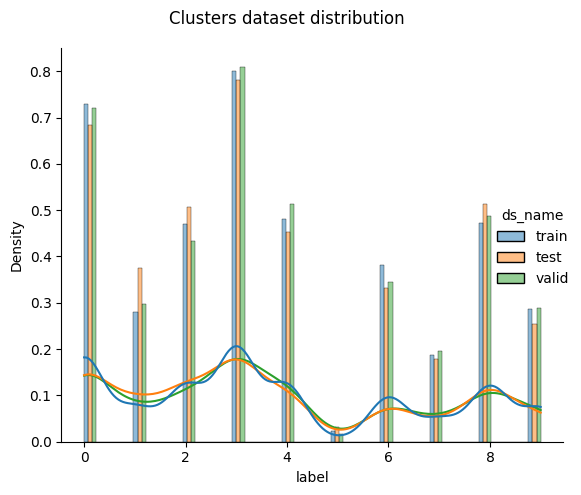

In [50]:
sns_plot = sns.displot(
  data=visu, x='label', hue='ds_name',
  kind='hist', stat='density', common_norm=False, kde=True,
  fill=True,
  multiple='dodge',
)

sns_plot.fig.suptitle('Clusters dataset distribution')
sns_plot.fig.tight_layout()
plt.savefig(os.path.join(output_path, 'Clusters dataset distribution.png'), format='png')

The probbaility distribution of the cluster is a litle bit dissimilar between the dataset with:
* classes 0, 3 and 6 (we can add to a lesser extend 8): over-represented in train dataset.
* class 5: under-represented in train dataset.

Valid and test dataset are quite similar.

That could create bias during learning.

<div class="alert alert-block alert-info">
<b>Note:</b>
The result are random_state dependent. So the classes under or over represented change with random_state value.
It also depend of the PCA result.
</div>



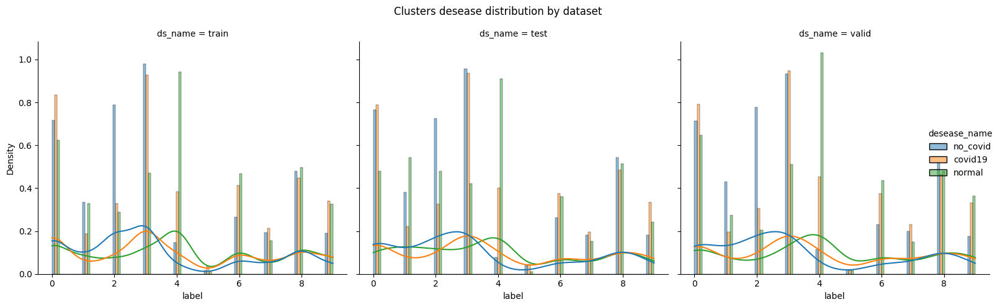

In [51]:
sns_plot = sns.displot(
  data=visu, x='label', hue='desease_name', col='ds_name',
  kind='hist', stat='density', common_norm=False, kde=True,
  fill=True,
  multiple='dodge',
)

sns_plot.fig.suptitle('Clusters desease distribution by dataset')
sns_plot.fig.tight_layout()
plt.savefig(os.path.join(output_path, 'Clusters desease distribution by dataset.png'), format='png')

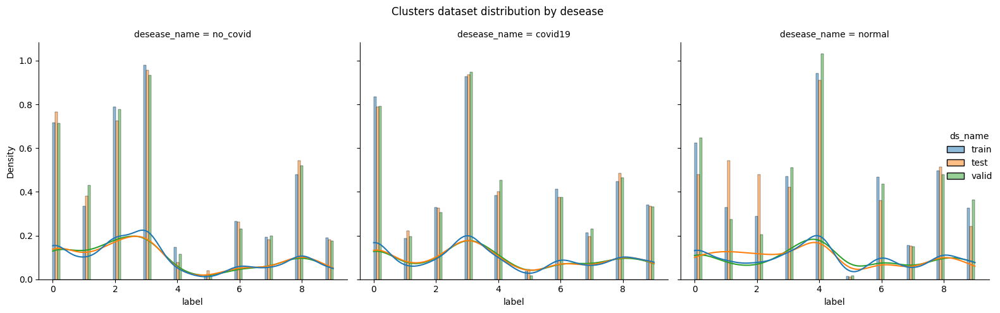

In [52]:
sns_plot = sns.displot(
  data=visu, x='label', hue='ds_name', col='desease_name',
  kind='hist', stat='density', common_norm=False, kde=True,
  fill=True,
  multiple='dodge',
)

sns_plot.fig.suptitle('Clusters dataset distribution by desease')
sns_plot.fig.tight_layout()
plt.savefig(os.path.join(output_path, 'Clusters dataset distribution by desease.png'), format='png')


The disimilarities in the probability distribution between the dataset show that the 3 datasets are not sampled from a common one. They are not representative of the same "reallity". That will lead to difficulties to obtain good generalisation results.

It would be good to make the distribution of classes by deseases identical in each dataset, using a specific sampling process. For instance compute the distribution of classes by desease over all the dataset. Then sampling for each dataset according to this distribution.
This work have not be done because is time consuming, a little tricky to implement and we first have to build a model and a learning process before fine tuning the dataset.

On the whole, the prob. distributions are pretty similar through the different dataset and we will use them as is for the training phase of our models.



Cluster plots

In [53]:
labels = pd.Series(kmeans.labels_, name='label').astype(int)
# print(labels.shape)

file_names_cleaned_extended = pd.concat([file_names_cleaned, labels, true_labels_cleaned], axis=1)
# print(file_names_cleaned_extended.isna().sum())
# print(file_names_cleaned_extended.head())

file_names_cleaned_extended.columns

Index(['file_name', 'label', 'db_name', 'ds_name', 'desease_name',
       'data_type_name'],
      dtype='object')

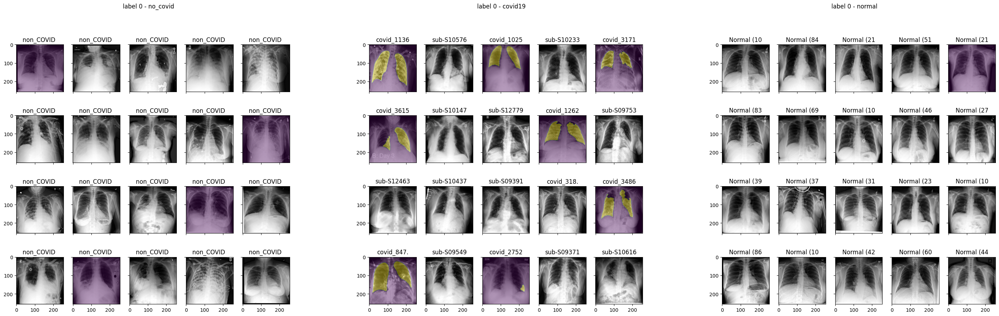

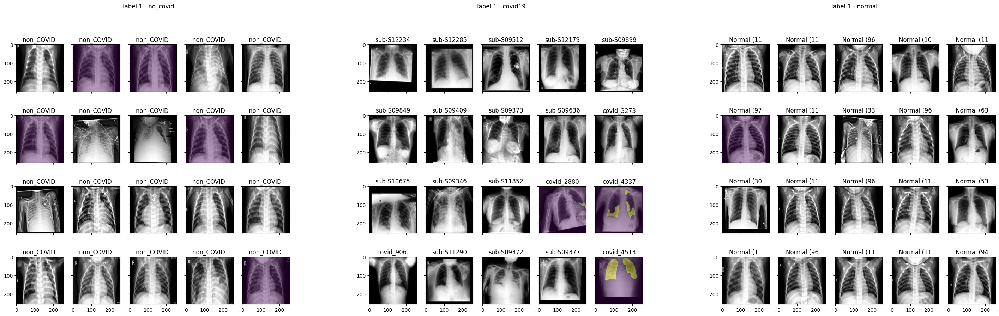

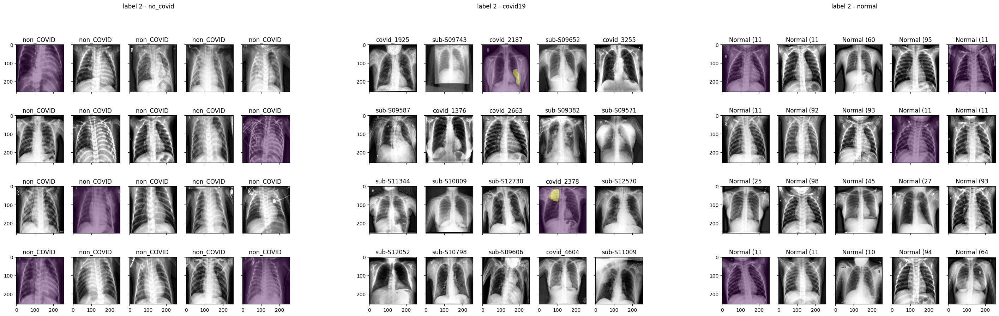

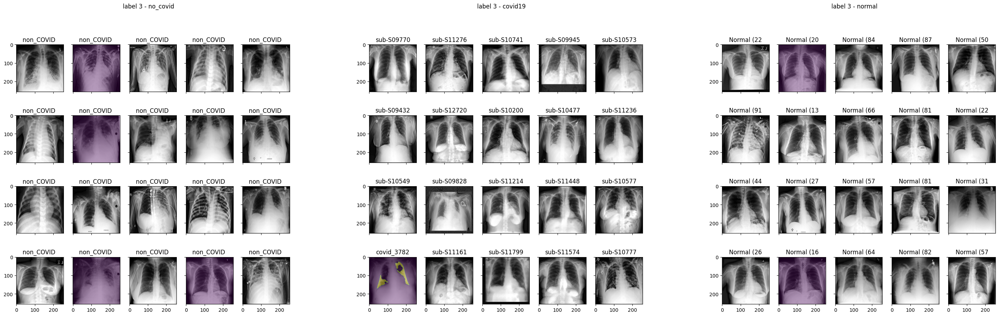

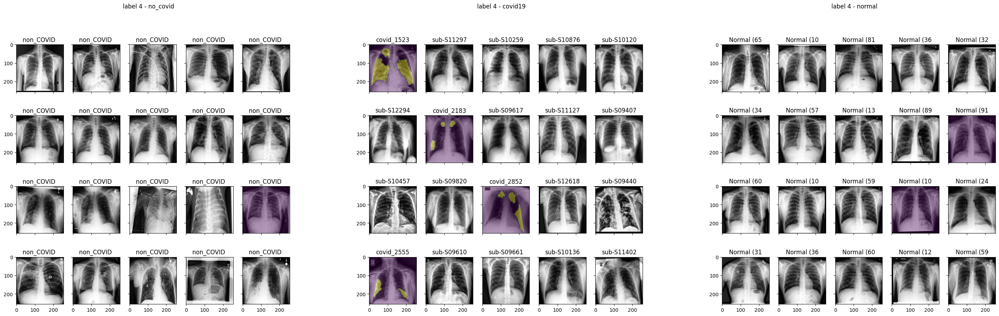

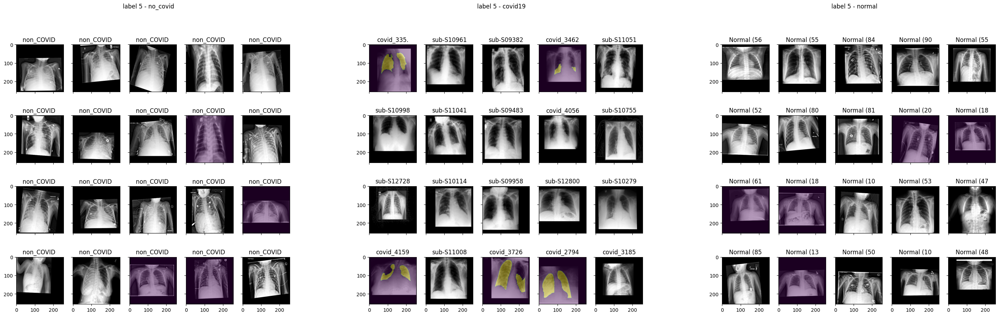

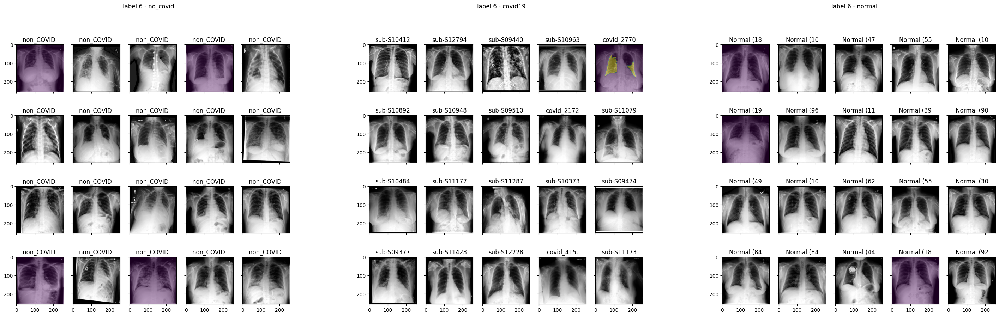

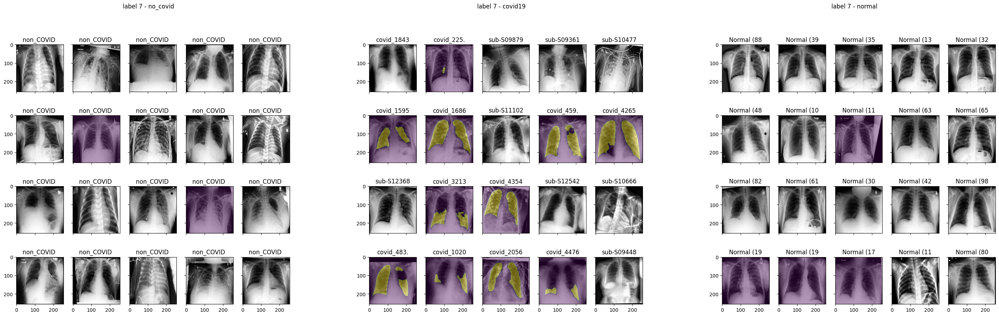

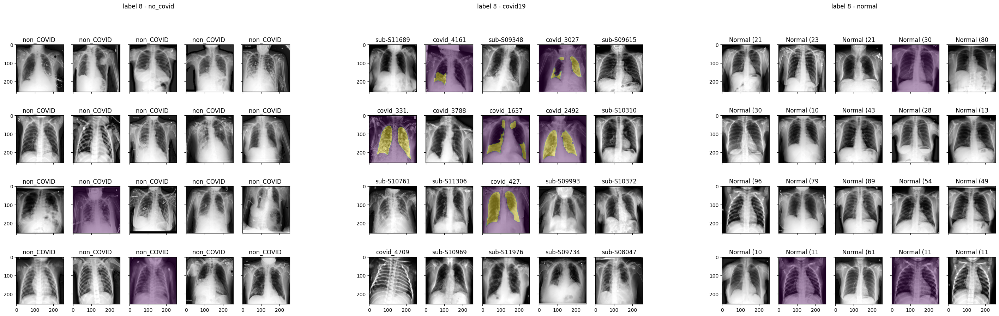

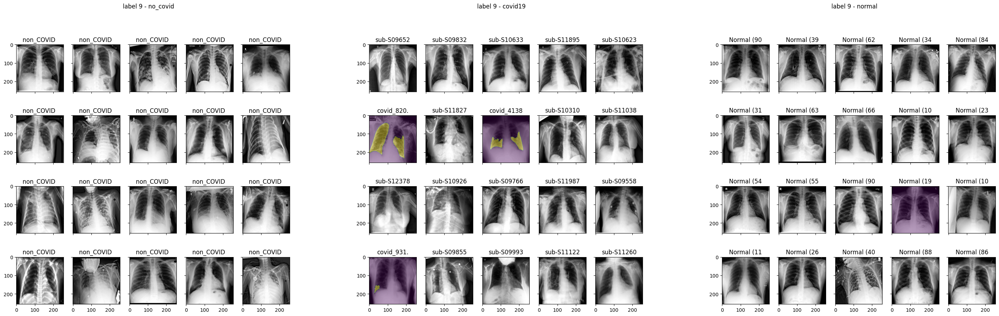

In [54]:
# sub_file_names = file_names_extended[file_names['db_name'] == infection_name]
sub_file_names = file_names_cleaned_extended
# print(sub_file_names.head())

labels_number = np.sort(sub_file_names['label'].unique())
# print(labels_number)

output_visu_path = os.path.join(output_path, 'clusters')
if not os.path.exists(output_visu_path):
    os.makedirs(output_visu_path, exist_ok=True)

nrows = 4
ncols = 5
num_img = nrows * ncols
for num_label in labels_number:
    label_file_names = sub_file_names[sub_file_names['label'] == num_label]
    # print(label_file_names.head())
    # n = len(label_file_names)
    
    deseases = label_file_names['desease_name'].unique()
    n_deseases = len(deseases)

    fig = plt.figure(figsize=(3*10, 10))
    sfigures = fig.subfigures(1, n_deseases)
    for i, des in enumerate(deseases):
        sfig = sfigures[i]
        ax = sfig.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
        sfig.suptitle('label ' + str(num_label) + " - " + des)
    
    for i, des in enumerate(deseases):
        sub_label_file_names = label_file_names[label_file_names['desease_name'] == des]
        # print(sub_label_file_names.head())
        n = len(sub_label_file_names)

        sfig = sfigures[i]
        axes = sfig.get_axes()
        
        samples = sub_label_file_names
        if (len(samples) >= num_img):
          samples = samples.sample(n=num_img, replace=False)
        # print(sub_label_file_names.head())
        # print('sample: ', sample)
        for k, (_, row) in enumerate(samples.iterrows()):
            # print('row: ', row)
            file_name = row['file_name']
            db_name = row['db_name']

            image = cv2.imread(file_name, 0)   
            image = cv2.equalizeHist(image)

            axe = axes[k]
            axe.imshow(image, cmap='gray')
            
            mask_infection_file_name = file_name.replace(images_dirname, infection_masks_dirname)
            mask_infection_file_name = mask_infection_file_name.replace(db_name_equalize, db_name_origin)
            # comment the following line if working on origin database
            mask_infection_file_name = mask_infection_file_name.replace(lung_dirname, infection_dirname)
            # print(mask_infection_file_name)
            if  os.path.exists(mask_infection_file_name):
                mask_infection = cv2.imread(mask_infection_file_name, 0) 
                axe.imshow(mask_infection, alpha=0.4)

            f_name = os.path.basename(file_name)[:10]
            # print(f_name)
            axe.set_title(f_name)

    plt.savefig(os.path.join(output_visu_path ,'label_' + str(num_label) + '.png'), format='png')
    plt.show()
    
# plt.show()

<div class="alert alert-block alert-info">
<b>Note:</b> Class 5 which is the less populated class, represents smaller x-ray which are put in a larger images to fit dimensions of the database images.
</div>

The following code let plot original images w.r.t image transformation as:
* equalize hist
* Test with CLAHE(Contrast Limited Adaptive Histogram Equalization)<br>
ref: https://docs.opencv.org/3.1.0/d5/daf/tutorial_py_histogram_equalization.html<br>

Comment / uncomment the code to obtain the plot you desire:
* origin and equalizeHist
* origin and CLASHE
* origin, equalizeHist and CLASHE

I finaly transform our data base only with equalize hist because:
* it's important to regulary distribute pixel intensity over the whole range of value, enhance the contrast
* that's correct dispatity between low / high intentsity due to acquisition devices or protocol

CLASHE do the same but:
* it creates dicontinuities in the images because it apply equalize_hidst by block.
* That creates image pixelisation as in jpeg wwhen you try to apply a high compress rate. This is not appropriate for our aims
* same if CLASHE reduce this block effect by applying interpolation, that introduces artefacts and smoothing in our image that lead to loss of information.

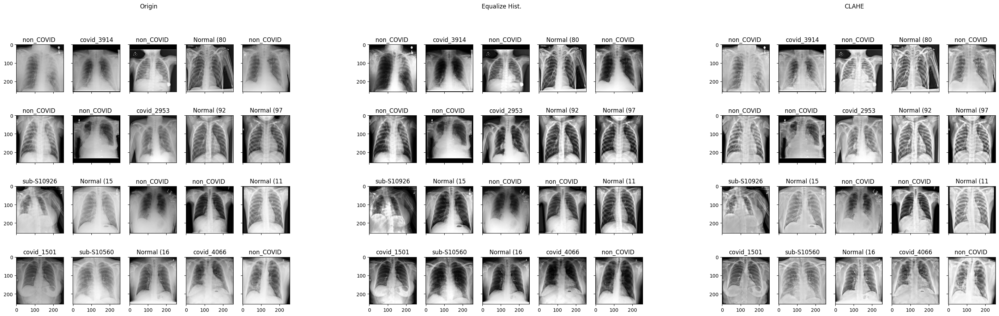

In [57]:

from random import sample

# build file_names list
file_names = []
w_paths = data_paths.loc[idx[lung_name,:,:,images_name]]['path']
for path in w_paths:
    full_file_path = os.path.join(db_path_origin, path)
    #print(full_file_path)

    f_names = os.listdir(full_file_path)
    full_f_names = [os.path.join(full_file_path, f_name) for f_name in f_names]
    file_names.extend(full_f_names)

# build multi-figure figure
# print(file_names[0])
n = len(file_names)

# fig = plt.figure(figsize=(2*10, 10))
# fig_0, fig_1 = fig.subfigures(1, 2)
fig = plt.figure(figsize=(3*10, 10))
fig_0, fig_1, fig_2 = fig.subfigures(1, 3)

fig_0.suptitle('Origin')
fig_1.suptitle('Equalize Hist.')
# fig_1.suptitle('CLAHE')
fig_2.suptitle('CLAHE')

nrows = 4
ncols = 5
num_img = nrows * ncols
fig_0.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_0 = fig_0.get_axes()
fig_1.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_1 = fig_1.get_axes()
fig_2.subplots(nrows=nrows, ncols=ncols, sharex=True, sharey=True)
axes_2 = fig_2.get_axes()

# define CLASHE function
contrast_limit = 1.0
clahe = cv2.createCLAHE(clipLimit=contrast_limit, tileGridSize=(16, 16))

# sample and plot
samples = file_names
if (len(samples) >= num_img):
  samples = sample(samples, num_img)
# print(samples.head())
for i, file_name in enumerate(samples):
    image_origin = cv2.imread(file_name, 0)    
    axes_0[i].imshow(image_origin, cmap='gray')
    
    image = cv2.equalizeHist(image_origin)
    # image = clahe.apply(image_origin)
    axes_1[i].imshow(image, cmap='gray')

    image = clahe.apply(image_origin)
    axes_2[i].imshow(image, cmap='gray')

    f_name = os.path.basename(file_name)[:10]
    axes_0[i].set_title(f_name)
    axes_1[i].set_title(f_name)
    axes_2[i].set_title(f_name)

# plt.savefig(os.path.join(output_path ,'equalizeHist.png'), format='png')
# plt.savefig(os.path.join(output_visu_path ,'CLASHE.png'), format='png')
plt.savefig(os.path.join(output_path ,'equalizeHist and CLASHE.png'), format='png')
plt.show()
